# Computer Vision
## Assignment 6

### Benjamin Wild

In [2]:
import pandas as pd
import numpy as np
import io as ioo
import base64

from skimage.filters import gaussian_filter
from skimage import io, color

from itertools import tee, islice
import imageio

from IPython.display import HTML

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

/usr/lib/python3.5/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [2]:
corners = np.fliplr(pd.read_csv('corners.cvs', header=None, dtype=np.float).as_matrix())

wsize = (9, 9)
assert(wsize[0] == wsize[1])

corners += wsize[0] // 2

In [3]:
def pairwise(iterable):
    a, b = tee(iterable)
    next(b, None)
    return zip(a, b)

def gaussian_kernel(size, sigma):
    a = np.zeros((size, size))
    center = size // 2
    a[center, center] = 1
    gaussian_kernel = gaussian_filter(a, sigma)
    gaussian_kernel /= np.sum(gaussian_kernel)
    gaussian_kernel *= size * size
    return gaussian_kernel

def preprocess(im):
    return np.pad(color.rgb2gray(im) / 255., wsize[0] // 2, mode='reflect')

def is_in_bounds(bounds, slice):
    return bounds[0] <= slice.start and slice.stop < bounds[1]

def in_image_bounds(img, slice_r, slice_c):
    return is_in_bounds((0, img.shape[0]), slice_r) and \
        is_in_bounds((0, img.shape[1]), slice_c)

In [4]:
reader = imageio.get_reader('beedance.avi')

W = gaussian_kernel(wsize[0], 2).flatten()
#W = np.ones(wsize).flatten() / (9 * 9)

trajectories = [corners.copy()]
for frame, (im0, im1) in islice(enumerate(pairwise(reader)), 940):   
    if frame % 50 == 0:
        print('.', end='')
    im0 = preprocess(im0)
    im1 = preprocess(im1)
        
    # skip faulty frame
    if np.count_nonzero(im0 == 0.) > 10000:
        continue
            
    shim0, svim0 = np.gradient(im0)
    dtim = im1 - im0
    
    v = np.zeros((len(corners), 2), dtype=np.float)
    
    for i ,(r, c) in enumerate(corners):

        if np.isnan(r) or np.isnan(c):
            corners[i] += np.array((np.nan, np.nan))
        else:                
            indices_r = slice(int(np.round(r-wsize[0]//2)), int(np.round(r+np.ceil(wsize[0]/2.))))
            indices_c = slice(int(np.round(c-wsize[1]//2)), int(np.round(c+np.ceil(wsize[0]/2.))))
            if not in_image_bounds(im0, indices_r, indices_c):
                corners[i] += np.array((np.nan, np.nan))
                continue

            wsh0 = shim0[indices_r, indices_c]
            wsv0 = svim0[indices_r, indices_c]
            wdt  = dtim[indices_r, indices_c]

            A = np.vstack((W * wsh0.flatten(), W * wsv0.flatten())).T
            b = -W * wdt.flatten()

            lhs = np.linalg.pinv(A.T @ A)
            rhs = A.T @ b
            v[i] = lhs @ rhs
                
            corners[i] += v[i]
    
    trajectories.append(corners.copy())

...................

In [7]:
trajectories = np.stack(trajectories)

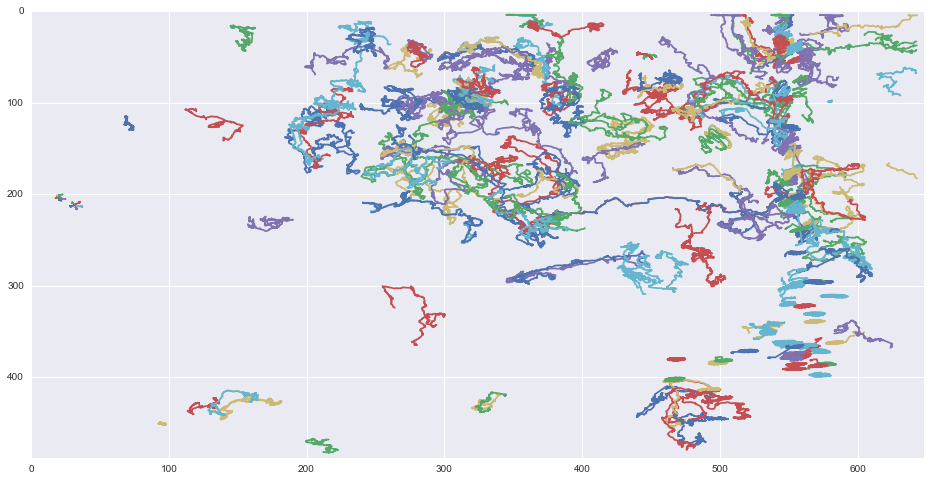

In [8]:
plt.figure(figsize=(16, 8))
for i in range(len(corners)):
    plt.plot(trajectories[:, i, 1], trajectories[:, i, 0])
    plt.xlim(0, im0.shape[1])
    plt.ylim(im0.shape[0], 0)
    plt.hold('on')

In [3]:
output_fname = 'tracked_bees.mp4'

In [ ]:
writer = imageio.get_writer(output_fname, fps=reader.get_meta_data()['fps'], quality=7)

for frame, im0 in islice(enumerate(reader), 939):   
    if frame % 50 == 0:
        print('.', end='')
    im0 = preprocess(im0)
        
    # skip faulty frame
    if np.count_nonzero(im0 == 0.) > 10000:
        continue
        
    fig, ax = plt.subplots(figsize=(16, 8))
    
    ax.imshow(im0, cmap=plt.cm.gray)
    ax.scatter(trajectories[frame, :, 1], trajectories[frame, :, 0])
    for i in range(len(corners)):
        ax.plot(trajectories[:frame+1, i, 1], trajectories[:frame+1, i, 0])
        
    ax.grid('off')
    ax.axis('off')
    ax.set_xlim(0, im0.shape[1])
    ax.set_ylim(im0.shape[0], 0)
    fig.tight_layout()
        
    fig.canvas.draw()   
    fig.savefig('tmp.png', bbox_inches='tight', pad_inches=0., frameon=False)
    
    writer.append_data(io.imread('tmp.png'))
    
    ax.clear()
    fig.clf()
        
writer.close()

In [4]:
video = ioo.open(output_fname, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))